In [3]:


# Install XGBoost if needed
!pip install xgboost --quiet

import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import time


# Load the data
df = pd.read_csv('men_2026_matchups_weighted.csv')


print(f"\nTotal games: {len(df)}")
print(f"Class distribution:\n{df['win'].value_counts()}")


# Define features
features = [
'3man_bpm',
'3man_dbpm',
'3man_dprpg',
'3man_obpm',
'3man_prpg',
'3pr',
'3prd',
'5man_bpm',
'5man_dbpm',
'5man_dprpg',
'5man_obpm',
'5man_prpg',
'assist_to_usage_ratio',
'astd_pct',
'bench',
'bench_scoring_ratio',
'blked_pct',
'def_3pt_fg_pct',
'def_3pt_share',
'def_assist_suppression',
'def_block_efficiency',
'def_close2_share',
'def_dunk_share',
'def_effective_possession_rate',
'def_experience_impact',
'def_far2_fg_pct',
'def_far2_share',
'def_lineup_depth_quality',
'def_paint_touch_rate',
'def_rim_efficiency',
'def_rim_to_three_ratio',
'def_size_speed_index',
'def_three_point_volume_efficiency',
'defensive_versatility_score',
'drb_pct',
'effective_possession_rate',
'experience_weighted_production',
'ftr',
'ftrd',
'kenpom_def',
'kenpom_off',
'kenpom_rtg',
'lineup_depth_quality',
'off_3pt_share',
'off_close2_fg_pct',
'off_close2_share',
'off_dunk_share',
'off_far2_fg_pct',
'off_far2_share',
'offense_defense_balance',
'offensive_versatility_score',
'orb_pct',
'paint_touch_rate',
'rim_efficiency',
'rim_to_three_ratio',
'rotation_balance',
'size',
'size_speed_index',
'torvik_def',
'torvik_off',
'torvik_rtg',
'wab'
]

print(f"\nNumber of features: {len(features)}")

X = df[features]
y = df['win']
X = X.fillna(X.median())

# Split data
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.20, random_state=42, stratify=y_temp)

print(f"\nTrain: {len(X_train)} | Val: {len(X_val)} | Test: {len(X_test)}")

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)




Total games: 3828
Class distribution:
win
0    1914
1    1914
Name: count, dtype: int64

Number of features: 62

Train: 2449 | Val: 613 | Test: 766


In [4]:

# =============================================================================
# STAGE 1: BROAD SEARCH
# =============================================================================
print("\n" + "="*80)
print("STAGE 1: BROAD SEARCH")
print("="*80 + "\n")

param_distributions_stage1 = {
    'n_estimators': [50, 100, 150, 200, 250, 300, 400, 500, 700, 1000],
    'max_depth': [2, 3, 4, 5, 6, 7, 8, 10, 12, 15, 18, 20],
    'learning_rate': [0.001, 0.005, 0.01, 0.015, 0.02, 0.03, 0.05, 0.07, 0.1, 0.15, 0.20, 0.25],
    'reg_alpha': [0, 0.01, 0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0],
    'reg_lambda': [0, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0, 50.0],
    'subsample': [0.4, 0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0],
    'colsample_bytree': [0.4, 0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0],
    'colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bynode': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'min_child_weight': [1, 3, 5, 7, 10, 15, 20, 25, 30, 40, 50],
    'gamma': [0, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0, 3.0, 5.0, 7.0, 10.0],
    'max_delta_step': [0, 1, 5, 10],
    'scale_pos_weight': [0.5, 1.0, 2.0, 3.0, 5.0],
}

xgb_stage1 = xgb.XGBClassifier(
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

random_search_stage1 = RandomizedSearchCV(
    estimator=xgb_stage1,
    param_distributions=param_distributions_stage1,
    n_iter=500,
    cv=4,
    scoring='accuracy',
    n_jobs=1,
    verbose=2,
    random_state=42,
    return_train_score=True
)

stage1_start = time.time()
print(f"Stage 1 started at: {time.strftime('%H:%M:%S')}")
random_search_stage1.fit(X_train_scaled, y_train)
stage1_time = time.time() - stage1_start

best_params_stage1 = random_search_stage1.best_params_

print(f"\n{'='*80}")
print(f"STAGE 1 COMPLETE - Actual Time: {stage1_time/60:.1f} minutes")
print(f"{'='*80}")
print(f"Best CV Score: {random_search_stage1.best_score_:.4f}")
print(f"\nBest Parameters:")
for param, value in best_params_stage1.items():
    print(f"  {param}: {value}")

stage1_model = random_search_stage1.best_estimator_
stage1_train = stage1_model.score(X_train_scaled, y_train)
stage1_val = stage1_model.score(X_val_scaled, y_val)
print(f"\nOverfitting Check: Train={stage1_train:.4f} | Val={stage1_val:.4f} | Gap={stage1_train - stage1_val:.4f}")



STAGE 1: BROAD SEARCH

Stage 1 started at: 00:32:05
Fitting 4 folds for each of 500 candidates, totalling 2000 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=5, n_estimators=200, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   3.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.25, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   4.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.75; total time=   2.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.75; total time=   3.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.75; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=400, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.75; total time=   2.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=40, n_estimators=50, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=7, n_estimators=200, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=12, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=12, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=12, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=12, min_child_weight=30, n_estimators=400, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=5.0, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=5.0, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=5.0, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=5.0, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=25, n_estimators=1000, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=25, n_estimators=1000, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=25, n_estimators=1000, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=25, n_estimators=1000, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=2.0, learning_rate=0.15, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=150, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=12, min_child_weight=1, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=12, min_child_weight=1, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=12, min_child_weight=1, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=10, max_depth=12, min_child_weight=1, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=50, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=50, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=50, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=50, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=50, reg_alpha=30.0, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.7, gamma=10.0, learning_rate=0.001, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.7s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=10, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=7.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=7, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=7, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=7, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=10.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=7, n_estimators=100, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=150, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=150, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=150, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=5, n_estimators=150, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.75, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=8, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.75, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=8, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.75, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=8, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.75, gamma=5.0, learning_rate=0.25, max_delta_step=0, max_depth=8, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.75, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=40, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   2.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.9; total time=   1.8s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=50, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=50, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=50, reg_alpha=30.0, reg_lambda=0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=50, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=1.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=100, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.25, max_delta_step=5, max_depth=20, min_child_weight=30, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.25, max_delta_step=5, max_depth=20, min_child_weight=30, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.25, max_delta_step=5, max_depth=20, min_child_weight=30, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.25, max_delta_step=5, max_depth=20, min_child_weight=30, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=10.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=15, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=15, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=15, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=7, min_child_weight=15, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=10, n_estimators=100, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.65, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=3, min_child_weight=1, n_estimators=700, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.9, gamma=1.0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=150, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=15, min_child_weight=30, n_estimators=300, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=150, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   3.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=2.0, learning_rate=0.005, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.95; total time=   1.8s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=50, n_estimators=50, reg_alpha=10.0, reg_la

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=100, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=100, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=100, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.07, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=100, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=6, min_child_weight=7, n_estimators=50, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=6, min_child_weight=7, n_estimators=50, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=6, min_child_weight=7, n_estimators=50, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=5, max_depth=6, min_child_weight=7, n_estimators=50, reg_alpha=0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=15, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   2.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=15, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=15, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=15, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=20, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=20, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=20, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=20, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.15, max_delta_step=1, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=700, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=700, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=700, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=700, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=700, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=15, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=15, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=15, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.5, learning_rate=0.005, max_delta_step=0, max_depth=15, min_child_weight=1, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.5; total time=   1.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=20, n_estimators=1000, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=500, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=12, min_child_weight=20, n_estimators=50, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=12, min_child_weight=20, n_estimators=50, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=12, min_child_weight=20, n_estimators=50, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0, learning_rate=0.01, max_delta_step=5, max_depth=12, min_child_weight=20, n_estimators=50, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=25, n_estimators=150, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=25, n_estimators=150, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=25, n_estimators=150, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=25, n_estimators=150, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=3.0, learning_rate=0.015, max_delta_step=10, max_depth=3, min_child_weight=30, n_estimators=200, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=1.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=1, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=1, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   3.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=1, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=1, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=50, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=50, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=50, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=50, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=5.0, subsample=1.0; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=50, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=1.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=40, n_estimators=400, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=500, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=500, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=500, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=500, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=50, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=50, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=50, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=50, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=5, max_depth=5, min_child_weight=15, n_estimators=150, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=7.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=7.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=7.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=7.0, learning_rate=0.005, max_delta_step=5, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=7, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=7, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=7, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=7, min_child_weight=25, n_estimators=100, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.15, max_delta_step=1, max_depth=20, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.15, max_delta_step=1, max_depth=20, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.15, max_delta_step=1, max_depth=20, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.95, gamma=0.1, learning_rate=0.15, max_delta_step=1, max_depth=20, min_child_weight=20, n_estimators=500, reg_alpha=0.05, reg_lambda=2.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.6s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=50, n_estimators=150, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=50, n_estimators=150, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=50, n_estimators=150, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=50, n_estimators=150, reg_alpha=0.5, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.5s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.2, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=50, n_estimators=100, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=18, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=18, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=18, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=18, min_child_weight=30, n_estimators=100, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=2.0, r

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=10, n_estimators=200, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.65; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.65; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=5.0, learning_rate=0.07, max_delta_step=5, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.5, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=2, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.65, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=4, min_child_weight=5, n_estimators=250, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=1, max_depth=6, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=1, max_depth=6, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=1, max_depth=6, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=1, max_depth=6, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   2.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=1.0, gamma=2.0, learning_rate=0.05, max_delta_step=1, max_depth=3, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=4, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=1000, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=100, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=400, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.07, max_delta_step=1, max_depth=2, min_child_weight=7, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=50, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=50, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.0s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=50, reg_alpha=0, reg_lambda=50.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=50, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=150, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.7, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=250, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=0, max_depth=3, min_child_weight=10, n_estimators=400, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.75, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.75, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.75, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.75, gamma=1.0, learning_rate=0.07, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=15, min_child_weight=50, n_estimators=300, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=15, min_child_weight=50, n_estimators=300, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=15, min_child_weight=50, n_estimators=300, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=15, min_child_weight=50, n_estimators=300, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=3.0, learning_rate=0.1, max_delta_step=0, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=4, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=5, n_estimators=500, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=7, n_estimators=1000, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=30, n_estimators=200, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.2, learning_rate=0.005, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=1.0; total time=   4.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=1.0; total time=   3.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=1.0; total time=   3.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=5.0, subsample=1.0; total time=   4.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=700, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.7s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=15, min_child_weight=5, n_estimators=150, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=100, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=100, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=100, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=100, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=1.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.01, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=40, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=250, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=250, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=250, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=1.0, learning_rate=0.2, max_delta_step=10, max_depth=6, min_child_weight=30, n_estimators=250, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.02, max_delta_step=0, max_depth=3, min_child_weight=30, n_estimators=300, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=100, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=200, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=200, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=200, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=10, max_depth=5, min_child_weight=50, n_estimators=200, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=700, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=700, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=700, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=1.0, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=700, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=5, n_estimators=50, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=5, n_estimators=50, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=5, n_estimators=50, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=18, min_child_weight=5, n_estimators=50, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=5.0, learning_rate=0.03, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=4, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=7.0, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=50, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=7.0, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=50, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=7.0, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=50, reg_alpha=5.0, reg_lambda=2

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=700, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=700, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=700, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=700, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=20.0, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=50, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=7, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.005, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0.01, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=12, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=12, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=12, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=5.0, learning_rate=0.1, max_delta_step=0, max_depth=12, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.01, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=200, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.005, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=150, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.005, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=150, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.005, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=150, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.005, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=150, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   2.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.95; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=10, max_depth=12, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.85, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.85, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.85, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.85, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=10, min_child_weight=15, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=10, min_child_weight=15, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=10, min_child_weight=15, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.25, max_delta_step=5, max_depth=10, min_child_weight=15, n_estimators=500, reg_alpha=0.1, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0, learning_rate=0.03, max_delta_step=5, max_depth=5, min_child_weight=40, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=0, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.6, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=500, reg_alpha=15.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=15, min_child_weight=40, n_estimators=400, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.15, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=5, n_estimators=250, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=5, n_estimators=250, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=5, n_estimators=250, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=5, n_estimators=250, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=6, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.5; total time=   1.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=1.0, learning_rate=0.1, max_delta_step=10, max_depth=6, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=30.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=3.0, learning_rate=0.01, max_delta_step=5, max_depth=8, min_child_weight=40, n_estimators=50, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.65, gamma=10.0, learning_rate=0.02, max_delta_step=10, max_depth=5, min_child_weight=20, n_estimators=400, reg_alpha=10.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=1.0, learning_rate=0.005, max_delta_step=10, max_depth=4, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=250, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=7, min_child_weight=50, n_estimators=700, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.95; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=100, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.6, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=700, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=700, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=700, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.9, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=700, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0, learning_rate=0.1, max_delta_step=1, max_depth=4, min_child_weight=30, n_estimators=250, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.4, gamma=3.0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   5.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   3.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   3.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.001, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   5.0s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.75, gamma=3.0, learning_rate=0.01, max_delta_step=1, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=50, n_estimators=50, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=50, n_estimators=50, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=50, n_estimators=50, reg_alpha=0, reg_lambda=15.0, sca

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=50, n_estimators=50, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=200, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=200, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=200, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=10, max_depth=7, min_child_weight=15, n_estimators=200, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=12, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=12, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=12, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=5.0, learning_rate=0.15, max_delta_step=0, max_depth=12, min_child_weight=7, n_estimators=500, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.65, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=150, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.15, max_delta_step=10, max_depth=7, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.15, max_delta_step=10, max_depth=7, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.15, max_delta_step=10, max_depth=7, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.5, learning_rate=0.15, max_delta_step=10, max_depth=7, min_child_weight=5, n_estimators=200, reg_alpha=0.5, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=200, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=200, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=200, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=200, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=1.0, gamma=0.1, learning_rate=0.02, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.01, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=250, reg_alpha=0.5, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.6, gamma=1.0, learning_rate=0.15, max_delta_step=1, max_depth=5, min_child_weight=10, n_estimators=700, reg_alpha=30.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=7, min_child_weight=30, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=7, min_child_weight=30, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=7, min_child_weight=30, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=1.0, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=7, min_child_weight=30, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=1, max_depth=15, min_child_weight=7, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=1.0; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=300, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=10, min_child_weight=7, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=10, min_child_weight=7, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=10, min_child_weight=7, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.02, max_delta_step=1, max_depth=10, min_child_weight=7, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.95; total time=   3.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.95; total time=   3.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.95; total time=   3.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.95; total time=   3.0s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=18, min_child_weight=7, n_estimators=250, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=18, min_child_weight=7, n_estimators=250, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=18, min_child_weight=7, n_estimators=250, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=18, min_child_weight=7, n_estimators=250, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=1.0, learning_rate=0.1, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=1.0, learning_rate=0.1, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=1.0, learning_rate=0.1, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=1.0, learning_rate=0.1, max_delta_step=0, max_depth=20, min_child_weight=3, n_estimators=250, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=20, n_estimators=1000, reg_alpha=10.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=15, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=15, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=15, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=6, min_child_weight=15, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=250, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.2, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.2, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.2, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0.2, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=300, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=5.0, learning_rate=0.25, max_delta_step=1, max_depth=3, min_child_weight=50, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.6, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=12, min_child_weight=3, n_estimators=150, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=150, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=20, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=20, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=20, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=10, max_depth=20, min_child_weight=25, n_estimators=150, reg_alpha=15.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.75, gamma=3.0, learning_rate=0.015, max_delta_step=5, max_depth=10, min_child_weight=40, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.8, gamma=3.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=50, n_estimators=1000, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.1, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=7, n_estimators=400, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=1.0; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.95, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=150, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=1.0, learning_rate=0.05, max_delta_step=5, max_depth=4, min_child_weight=25, n_estimators=300, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.05, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.1, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=18, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=18, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=18, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=18, min_child_weight=20, n_estimators=300, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.9; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.85, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.85, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.85, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.85, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=10, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=1.0, learning_rate=0.03, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   3.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:40:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.005, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   2.7s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=150, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.2, learning_rate=0.01, max_delta_step=5, max_depth=4, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=18, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=18, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=18, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.15, max_delta_step=0, max_depth=18, min_child_weight=10, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=50, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=50, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=50, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=50, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=8, min_child_weight=20, n_estimators=400, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.5, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=10.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=40, n_estimators=150, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=15, n_estimators=150, reg_alpha=0.01, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=2.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=15, n_estimators=100, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.5, gamma=10.0, learning_rate=0.25, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=150, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=15, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.05, learning_rate=0.005, max_delta_step=10, max_depth=6, min_child_weight=10, n_estimators=150, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=20, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=20, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=20, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=2.0, learning_rate=0.001, max_delta_step=5, max_depth=20, min_child_weight=25, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=1000, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.03, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=5.0, learning_rate=0.015, max_delta_step=10, max_depth=20, min_child_weight=10, n_estimators=150, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=1.0, gamma=3.0, learning_rate=0.015, max_delta_step=0, max_depth=4, min_child_weight=25, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.85, gamma=5.0, learning_rate=0.05, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=200, reg_alpha=0.5, reg_lambda=20.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.005, max_delta_step=0, max_depth=4, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.7s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.5, gamma=10.0, learning_rate=0.015, max_delta_step=1, max_depth=10, min_child_weight=10, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=10, max_depth=18, min_child_weight=20, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=10, max_depth=18, min_child_weight=20, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=10, max_depth=18, min_child_weight=20, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.8, gamma=2.0, learning_rate=0.15, max_delta_step=10, max_depth=18, min_child_weight=20, n_estimators=1000, reg_alpha=0.01, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.05, max_delta_step=0, max_depth=6, min_child_weight=25, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.05, max_delta_step=0, max_depth=6, min_child_weight=25, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.05, max_delta_step=0, max_depth=6, min_child_weight=25, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.05, max_delta_step=0, max_depth=6, min_child_weight=25, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.9, gamma=3.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=20, n_estimators=200, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.5, learning_rate=0.01, max_delta_step=0, max_depth=5, min_child_weight=25, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=5.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=40, n_estimators=150, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=40, n_estimators=150, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=40, n_estimators=150, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=1.0, learning_rate=0.015, max_delta_step=10, max_depth=12, min_child_weight=40, n_estimators=150, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=1.0, gamma=5.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=1, n_estimators=150, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=10, n_estimators=50, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=1.0, reg_lambda

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=20, n_estimators=1000, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=1.0, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=18, min_child_weight=40, n_estimators=1000, reg_alpha=15.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=20, n_estimators=50, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=20, n_estimators=50, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=20, n_estimators=50, reg_alpha=10.0, reg_la

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.4, gamma=7.0, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=20, n_estimators=50, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=50, n_estimators=250, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.5, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=8, min_child_weight=10, n_estimators=50, reg_alpha=1.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.1, learning_rate=0.07, max_delta_step=5, max_depth=3, min_child_weight=10, n_estimators=500, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=1.0, learning_rate=0.05, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=1000, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.7, gamma=5.0, learning_rate=0.02, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=1000, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.95, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.95; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=15, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=15, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=15, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   2.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.03, max_delta_step=0, max_depth=15, min_child_weight=3, n_estimators=700, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.5; total time=   1.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=7.0, learning_rate=0.25, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.2, learning_rate=0.1, max_delta_step=1, max_depth=3, min_child_weight=15, n_estimators=200, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=15, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=15, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=15, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.5, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=15, min_child_weight=3, n_estimators=1000, reg_alpha=0.01, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=10, min_child_weight=30, n_estimators=300, reg_alpha=0, reg_lambda=10.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=25, n_estimators=250, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=25, n_estimators=250, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=25, n_estimators=250, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.001, max_delta_step=5, max_depth=15, min_child_weight=25, n_estimators=250, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=1.0; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.07, max_delta_step=0, max_depth=2, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.15, max_delta_step=10, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.001, max_delta_step=10, max_depth=2, min_child_weight=15, n_estimators=400, reg_alpha=0.01, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=12, min_child_weight=15, n_estimators=200, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.5, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.01, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=100, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.65, gamma=2.0, learning_rate=0.05, max_delta_step=10, max_depth=10, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.75, gamma=1.0, learning_rate=0.15, max_delta_step=5, max_depth=7, min_child_weight=20, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=7, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.65, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.07, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=150, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=25, n_estimators=500, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.6s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.03, max_delta_step=1, max_depth=2, min_child_weight=5, n_estimators=150, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.05, learning_rate=0.05, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=3.0, learning_rate=0.05, max_delta_step=1, max_depth=5, min_child_weight=40, n_estimators=500, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=3.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=7.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=7.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=7.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=1.0; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.65, gamma=7.0, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.65, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.65, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.65, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.65, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=1, n_estimators=50, reg_alpha=2.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.02, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.85; total time=   2.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_l

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.2, learning_rate=0.02, max_delta_step=0, max_depth=20, min_child_weight=30, n_estimators=50, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=250, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=250, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=250, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=250, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=2.0, learning_rate=0.02, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=15, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.4; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=20, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=20, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=20, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=20, min_child_weight=3, n_estimators=700, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.2, learning_rate=0.05, max_delta_step=10, max_depth=20, min_child_weight=7, n_estimators=200, reg_alpha=0.05, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=7, min_child_weight=7, n_estimators=200, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=18, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=18, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=18, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=18, min_child_weight=15, n_estimators=500, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=5.0, learning_rate=0.2, max_delta_step=10, max_depth=4, min_child_weight=25, n_estimators=250, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=250, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=250, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=250, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=1.0, gamma=5.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=250, reg_alpha=0.01, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.4, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=40, n_estimators=150, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.03, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=50, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.7, gamma=0.05, learning_rate=0.03, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=300, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=20, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=3.0, subsample=0.9; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.001, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.001, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.001, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.2, learning_rate=0.001, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=15, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=15, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=15, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=2.0, learning_rate=0.001, max_delta_step=0, max_depth=15, min_child_weight=50, n_estimators=250, reg_alpha=1.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.6; total time=   0.3s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.75, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=5, min_child_weight=10, n_estimators=200, reg_alpha=0.1, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.1, max_delta_step=1, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.1, max_delta_step=1, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.1, max_delta_step=1, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.4, gamma=7.0, learning_rate=0.1, max_delta_step=1, max_depth=15, min_child_weight=15, n_estimators=200, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.2, learning_rate=0.25, max_delta_step=0, max_depth=4, min_child_weight=10, n_estimators=250, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=15, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=15, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=15, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.5, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=15, min_child_weight=50, n_estimators=150, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=5, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=5, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=5, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=10, min_child_weight=5, n_estimators=200, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.95, gamma=3.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=20, n_estimators=200, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.8, colsample_bytree=0.65, gamma=7.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.05, max_delta_step=5, max_depth=6, min_child_weight=15, n_estimators=200, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.15, max_delta_step=5, max_depth=2, min_child_weight=20, n_estimators=100, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.015, max_delta_step=5, max_depth=5, min_child_weight=20, n_estimators=500, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.75, gamma=10.0, learning_rate=0.01, max_delta_step=10, max_depth=8, min_child_weight=25, n_estimators=500, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=20, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=20.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.4, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=10, n_estimators=250, reg_alpha=0, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.95, gamma=0.5, learning_rate=0.15, max_delta_step=1, max_depth=7, min_child_weight=10, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   2.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   3.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.01, max_delta_step=10, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.9; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=3.0, learning_rate=0.05, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.01, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.75; total time=   2.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=1.0, gamma=0.5, learning_rate=0.01, max_delta_step=5, max_depth=10, min_child_weight=30, n_estimators=1000, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=10.0, learning_rate=0.2, max_delta_step=10, max_depth=10, min_child_weight=3, n_estimators=50, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.7, gamma=10.0, learning_rate=0.07, max_delta_step=1, max_depth=18, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=7, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=7, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=7, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=0.05, learning_rate=0.015, max_delta_step=10, max_depth=7, min_child_weight=30, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.7, gamma=0.2, learning_rate=0.02, max_delta_step=10, max_depth=2, min_child_weight=7, n_estimators=400, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.8, gamma=7.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=200, reg_alpha=30.0, reg_lambda=15.0, scale_pos_weight=2.0, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=5, max_depth=18, min_child_weight=20, n_estimators=150, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=250, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=250, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=250, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=250, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=1.0, subsample=1.0; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0, learning_rate=0.07, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=1000, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.95; total time=   1.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.95, gamma=10.0, learning_rate=0.07, max_delta_step=10, max_depth=20, min_child_weight=5, n_estimators=100, reg_alpha=15.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.8, gamma=2.0, learning_rate=0.05, max_delta_step=0, max_depth=2, min_child_weight=3, n_estimators=500, reg_alpha=30.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.2, learning_rate=0.015, max_delta_step=1, max_depth=5, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.85; total time=   1.8s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=30, n_estimators=100, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=30, n_estimators=100, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=30, n_estimators=100, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=30, n_estimators=100, reg_alpha=0.1, reg_lambda=5.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.9, gamma=7.0, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=50, n_estimators=50, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.07, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=50, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.4, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=10.0, scale_pos_weight=5.0, subsample=0.85; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.75; total time=   0.7s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.95, gamma=1.0, learning_rate=0.25, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=100, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=1.0, learning_rate=0.25, max_delta_step=0, max_depth=12, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.95; total time=   1.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=5.0, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=50, reg_alpha=0.5, reg_lambda=5.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=0.7, gamma=7.0, learning_rate=0.15, max_delta_step=5, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=25, n_estimators=300, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=150, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=150, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=150, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=150, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=12, min_child_weight=20, n_estimators=500, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=12, min_child_weight=20, n_estimators=500, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=12, min_child_weight=20, n_estimators=500, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.7, gamma=5.0, learning_rate=0.03, max_delta_step=1, max_depth=12, min_child_weight=20, n_estimators=500, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.85, gamma=10.0, learning_rate=0.07, max_delta_step=5, max_depth=2, min_child_weight=25, n_estimators=500, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.7, gamma=7.0, learning_rate=0.07, max_delta_step=1, max_depth=10, min_child_weight=25, n_estimators=50, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.2, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.2, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.2, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=2.0, learning_rate=0.2, max_delta_step=10, max_depth=20, min_child_weight=15, n_estimators=250, reg_alpha=0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.9; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=2, min_child_weight=5, n_estimators=400, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.9, gamma=3.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=40, n_estimators=1000, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=2.0, subsample=0.95; total time=   0.5s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.5, learning_rate=0.01, max_delta_step=1, max_depth=3, min_child_weight=1, n_estimators=100, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.85, gamma=1.0, learning_rate=0.001, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=200, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.75; total time=   1.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0,

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=0.8, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=50, reg_alpha=2.0, reg_lambda=5.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=18, min_child_weight=1, n_estimators=400, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=18, min_child_weight=1, n_estimators=400, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=18, min_child_weight=1, n_estimators=400, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.6, gamma=5.0, learning_rate=0.1, max_delta_step=10, max_depth=18, min_child_weight=1, n_estimators=400, reg_alpha=0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.7, gamma=5.0, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.03, max_delta_step=10, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.1, max_delta_step=5, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=500, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.75, gamma=7.0, learning_rate=0.25, max_delta_step=5, max_depth=2, min_child_weight=1, n_estimators=200, reg_alpha=1.0, reg_lambda=20.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.95, gamma=2.0, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.7, colsample_bytree=0.85, gamma=3.0, learning_rate=0.02, max_delta_step=10, max_depth=12, min_child_weight=10, n_estimators=100, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.1, max_delta_step=10, max_depth=2, min_child_weight=30, n_estimators=1000, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=5.0, subsample=0.4; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.95, gamma=0.05, learning_rate=0.02, max_delta_step=10, max_depth=7, min_child_weight=7, n_estimators=50, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.15, max_delta_step=5, max_depth=18, min_child_weight=7, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.15, max_delta_step=5, max_depth=18, min_child_weight=7, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.15, max_delta_step=5, max_depth=18, min_child_weight=7, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.5, gamma=0.1, learning_rate=0.15, max_delta_step=5, max_depth=18, min_child_weight=7, n_estimators=700, reg_alpha=15.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.5, gamma=10.0, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=25, n_estimators=150, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.95, gamma=7.0, learning_rate=0.015, max_delta_step=5, max_depth=2, min_child_weight=3, n_estimators=100, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=700, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=700, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=700, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.05, max_delta_step=0, max_depth=5, min_child_weight=30, n_estimators=700, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=4, min_child_weight=3, n_estimators=50, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6, gamma=7.0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=2.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.25, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=700, reg_alpha=30.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.5, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=12, min_child_weight=50, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=40, n_estimators=300, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=40, n_estimators=300, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=40, n_estimators=300, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.4, gamma=0, learning_rate=0.25, max_delta_step=5, max_depth=6, min_child_weight=40, n_estimators=300, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.9; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.95; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.75, gamma=0.1, learning_rate=0.01, max_delta_step=10, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.95; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=30.0, reg_lambda=50.0, scale_pos_weight=5.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.9, gamma=0.1, learning_rate=0.015, max_delta_step=1, max_depth=20, min_child_weight=25, n_estimators=400, reg_alpha=0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.1, max_delta_step=5, max_depth=12, min_child_weight=5, n_estimators=200, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=1.0, colsample_bytree=0.6, gamma=5.0, learning_rate=0.001, max_delta_step=10, max_depth=20, min_child_weight=20, n_estimators=300, reg_alpha=0, reg_lambda=30.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=50, reg_alpha=2.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=50, reg_alpha=2.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=50, n_estimators=50, reg_alpha=2.0, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=18, min_child_weight=30, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=18, min_child_weight=30, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=18, min_child_weight=30, n_estimators=50, reg_alpha=1.0, reg_lambda=15.0, scale_pos_weight=3.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.25, max_delta_step=1, max_depth=18, min_child_weight=30, n_estimators=50, reg_alpha=1.0, reg_lambd

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=4, min_child_weight=20, n_estimators=100, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=40, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=40, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=40, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.4, colsample_bytree=1.0, gamma=1.0, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=40, n_estimators=200, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.9, colsample_bytree=1.0, gamma=5.0, learning_rate=0.07, max_delta_step=10, max_depth=12, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=400, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=400, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=400, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=7.0, learning_rate=0.03, max_delta_step=1, max_depth=4, min_child_weight=50, n_estimators=400, reg_alpha=15.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.03, max_delta_step=5, max_depth=8, min_child_weight=7, n_estimators=50, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0, learning_rate=0.03, max_delta_step=10, max_depth=3, min_child_weight=50, n_estimators=100, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=500, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=500, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=500, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=0.95, gamma=0.05, learning_rate=0.15, max_delta_step=1, max_depth=18, min_child_weight=7, n_estimators=500, reg_alpha=20.0, reg_lambda=0.1, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.01, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.95; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=18, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=18, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=18, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.4, gamma=5.0, learning_rate=0.05, max_delta_step=0, max_depth=18, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=10.0, scale_pos_weight=0.5, subsample=1.0; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.4, gamma=1.0, learning_rate=0.01, max_delta_step=10, max_depth=18, min_child_weight=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=500, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=500, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=500, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.4, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=20, min_child_weight=40, n_estimators=500, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=10.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=10.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=10.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.8, gamma=10.0, learning_rate=0.1, max_delta_step=0, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=30.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=1.0, gamma=0.05, learning_rate=0.015, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=1.0, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.001, max_delta_step=1, max_depth=15, min_child_weight=1, n_estimators=250, reg_alpha=15.0, reg_lambda=2.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=0.9, gamma=1.0, learning_rate=0.02, max_delta_step=5, max_depth=5, min_child_weight=50, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=3.0, subsample=1.0; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.75, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=6, min_child_weight=30, n_estimators=1000, reg_alpha=0.05, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.5, learning_rate=0.005, max_delta_step=5, max_depth=5, min_child_weight=25, n_estimators=400, reg_alpha=0.01, reg_lambda=2.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.4s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.95, gamma=2.0, learning_rate=0.01, max_delta_step=1, max_depth=2, min_child_weight=15, n_estimators=200, reg_alpha=30.0, reg_lambda=1.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.5, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=2, min_child_weight=10, n_estimators=250, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=5.0, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.9, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=10, min_child_weight=30, n_estimators=700, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.8; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.015, max_delta_step=0, max_depth=20, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.5, learning_rate=0.15, max_delta_step=0, max_depth=5, min_child_weight=40, n_estimators=100, reg_alpha=0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=0, max_depth=10, min_child_weight=25, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=0, max_depth=10, min_child_weight=25, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=0, max_depth=10, min_child_weight=25, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.9, gamma=0.1, learning_rate=0.02, max_delta_step=0, max_depth=10, min_child_weight=25, n_estimators=400, reg_alpha=0.5, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=10.0, reg_lambda=5.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.2, max_delta_step=1, max_depth=2, min_child_weight=50, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=15, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=15, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=15, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=10.0, learning_rate=0.015, max_delta_step=10, max_depth=15, min_child_weight=25, n_estimators=700, reg_alpha=20.0, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   2.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   2.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   2.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.7, colsample_bytree=0.5, gamma=10.0, learning_rate=0.001, max_delta_step=10, max_depth=15, min_child_weight=7, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=5.0, subsample=0.8; total time=   4.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=1.0, colsample_bytree=0.85, gamma=2.0, learning_rate=0.07, max_delta_step=1, max_depth=15, min_child_weight=40, n_estimators=200, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.6, colsample_bytree=0.9, gamma=0.2, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=40, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.7, colsample_bynode=0.4, colsample_bytree=0.5, gamma=5.0, learning_rate=0.2, max_delta_step=5, max_depth=2, min_child_weight=7, n_estimators=200, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.4, gamma=2.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=50, n_estimators=700, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.95; total time=   0.3s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.5, colsample_bytree=0.65, gamma=2.0, learning_rate=0.03, max_delta_step=10, max_depth=2, min_child_weight=10, n_estimators=300, reg_alpha=5.0, reg_lambda=50.0, scale_pos_weight=3.0, subsample=0.95; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=0, max_depth=3, min_child_weight=3, n_estimators=250, reg_alpha=20.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=50.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.4, colsample_bytree=1.0, gamma=2.0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=5

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.8, colsample_bytree=0.75, gamma=3.0, learning_rate=0.25, max_delta_step=0, max_depth=20, min_child_weight=10, n_estimators=300, reg_alpha=0.01, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=250, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=250, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=250, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=7.0, learning_rate=0.015, max_delta_step=10, max_depth=4, min_child_weight=3, n_estimators=250, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.8, gamma=0.2, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=0.05, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.85; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.95, gamma=0.05, learning_rate=0.005, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=1.0; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.15, max_delta_step=0, max_depth=8, min_child_weight=25, n_estimators=700, reg_alpha=30.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=1.0; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=1000, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=1000, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=1000, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.25, max_delta_step=10, max_depth=8, min_child_weight=50, n_estimators=1000, reg_alpha=10.0, reg_lambda=15.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=18, min_child_weight=1, n_estimators=700, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=18, min_child_weight=1, n_estimators=700, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=18, min_child_weight=1, n_estimators=700, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.85, gamma=0.5, learning_rate=0.1, max_delta_step=5, max_depth=18, min_child_weight=1, n_estimators=700, reg_alpha=15.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.5, gamma=0.1, learning_rate=0.015, max_delta_step=5, max_depth=8, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=2.0, scale_pos_weight=5.0, subsample=0.8; total time=   0.4s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.95, gamma=7.0, learning_rate=0.05, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=300, reg_alpha=0.01, reg_lambda=15.0, scale_pos_weight=3.0, subsample=1.0; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.7, colsample_bytree=0.65, gamma=7.0, learning_rate=0.001, max_delta_step=1, max_depth=5, min_child_weight=7, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.85, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=4, min_child_weight=15, n_estimators=300, reg_alpha=30.0, reg_lambda=20.0, scale_pos_weight=3.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.5, colsample_bytree=0.65, gamma=0.1, learning_rate=0.005, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.6s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s
[CV] END colsample_bylevel=1.0, colsample_bynode=0.4, colsample_bytree=0.9, gamma=7.0, learning_rate=0.001, max_delta_step=10, max_depth=4, min_child_weight=5, n_estimators=100, reg_alpha=20.0, reg_lambda=30.0, scale_pos_weight=0.5, subsample=0.4; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.5, colsample_bytree=0.75, gamma=0.1, learning_rate=0.05, max_delta_step=10, max_depth=3, min_child_weight=40, n_estimators=700, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=40, n_estimators=100, reg_alpha=15.0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.6, colsample_bytree=0.8, gamma=7.0, learning_rate=0.005, max_delta_step=1, max_depth=4, min_child_weight=25, n_estimators=700, reg_alpha=15.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.9; total time=   2.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.9; total time=   3.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.9; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.8, gamma=2.0, learning_rate=0.001, max_delta_step=10, max_depth=18, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=20.0, scale_pos_weight=1.0, subsample=0.9; total time=   2.0s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.8, gamma=10.0, learning_rate=0.15, max_delta_step=0, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=20.0, reg_lambda=15.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.02, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=200, reg_alpha=2.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.9; total time=   0.4s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.0s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.9, colsample_bynode=0.7, colsample_bytree=0.85, gamma=2.0, learning_rate=0.005, max_delta_step=1, max_depth=2, min_child_weight=40, n_estimators=50, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=18, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=18, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=18, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=1.0, gamma=0.05, learning_rate=0.001, max_delta_step=5, max_depth=18, min_child_weight=50, n_estimators=200, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=20, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=20, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=20, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.4, gamma=10.0, learning_rate=0.01, max_delta_step=1, max_depth=6, min_child_weight=20, n_estimators=1000, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.9; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.4, colsample_bytree=0.65, gamma=0.2, learning_rate=0.015, max_delta_step=0, max_depth=3, min_child_weight=25, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.4; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.7, colsample_bynode=0.9, colsample_bytree=0.9, gamma=2.0, learning_rate=0.1, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=20.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.95; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.02, max_delta_step=1, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.02, max_delta_step=1, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.02, max_delta_step=1, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.4, colsample_bytree=1.0, gamma=10.0, learning_rate=0.02, max_delta_step=1, max_depth=18, min_child_weight=40, n_estimators=300, reg_alpha=0, reg_lambda=50.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.25, max_delta_step=0, max_depth=7, min_child_weight=15, n_estimators=300, reg_alpha=20.0, reg_lambda=5.0, scale_pos_weight=2.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.001, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=15.0, reg_lambda=20.0, scale_pos_weight=2.0, subsample=0.9; total time=   2.0s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=7.0, learning_rate=0.15, max_delta_step=0, max_depth=3, min_child_weight=20, n_estimators=250, reg_alpha=20.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.85; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.2, learning_rate=0.03, max_delta_step=0, max_depth=18, min_child_weight=15, n_estimators=100, reg_alpha=20.0, reg_lambda=10.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.2s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.3s
[CV] END colsample_bylevel=0.9, colsample_bynode=0.6, colsample_bytree=0.6, gamma=0.1, learning_rate=0.005, max_delta_step=5, max_depth=10, min_child_weight=50, n_estimators=300, reg_alpha=5.0, reg_lambda=15.0, scale_pos_weight=1.0, subsample=0.4; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=1.0, colsample_bytree=0.95, gamma=0.5, learning_rate=0.001, max_delta_step=0, max_depth=4, min_child_weight=5, n_estimators=200, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.95; total time=   0.6s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=10, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=10, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=10, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.2s
[CV] END colsample_bylevel=0.8, colsample_bynode=0.5, colsample_bytree=0.9, gamma=10.0, learning_rate=0.25, max_delta_step=0, max_depth=10, min_child_weight=20, n_estimators=100, reg_alpha=0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=200, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=200, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.85; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=200, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.5, colsample_bytree=0.8, gamma=1.0, learning_rate=0.001, max_delta_step=5, max_depth=7, min_child_weight=30, n_estimators=200, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.85; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.4, gamma=10.0, learning_rate=0.015, max_delta_step=5, max_depth=20, min_child_weight=1, n_estimators=250, reg_alpha=0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=1.0, colsample_bynode=0.8, colsample_bytree=1.0, gamma=10.0, learning_rate=0.01, max_delta_step=0, max_depth=4, min_child_weight=30, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.95, gamma=2.0, learning_rate=0.05, max_delta_step=5, max_depth=7, min_child_weight=15, n_estimators=50, reg_alpha=20.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.9, colsample_bynode=0.4, colsample_bytree=0.8, gamma=0, learning_rate=0.005, max_delta_step=5, max_depth=7, min_child_weight=50, n_estimators=300, reg_alpha=30.0, reg_lambda=30.0, scale_pos_weight=5.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)



STAGE 1 COMPLETE - Actual Time: 16.1 minutes
Best CV Score: 0.9236

Best Parameters:
  subsample: 0.65
  scale_pos_weight: 1.0
  reg_lambda: 0.01
  reg_alpha: 1.0
  n_estimators: 500
  min_child_weight: 1
  max_depth: 7
  max_delta_step: 1
  learning_rate: 0.2
  gamma: 0.05
  colsample_bytree: 0.75
  colsample_bynode: 0.9
  colsample_bylevel: 0.4

Overfitting Check: Train=1.0000 | Val=0.9347 | Gap=0.0653


In [5]:
# =============================================================================
# STAGE 2: FOCUSED SEARCH AROUND BEST PARAMS
# =============================================================================
print("\n" + "="*80)
print("STAGE 2: FOCUSED SEARCH")
print("="*80 + "\n")

def get_range(value, options_list, expand_by=2):
    if value is None:
        return [None]
    if value not in options_list:
        return [value]

    idx = options_list.index(value)
    start_idx = max(0, idx - expand_by)
    end_idx = min(len(options_list), idx + expand_by + 1)
    return options_list[start_idx:end_idx]

n_estimators_opts = [50, 100, 150, 200, 250, 300, 400, 500, 700, 1000, 1500]
max_depth_opts = [2, 3, 4, 5, 6, 7, 8, 10, 12, 15, 20]
learning_rate_opts = [0.001, 0.005, 0.008, 0.01, 0.015, 0.02, 0.025, 0.03, 0.04, 0.05, 0.07, 0.1, 0.15]
reg_alpha_opts = [0, 0.001, 0.01, 0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0, 50.0]
reg_lambda_opts = [0, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0, 30.0, 50.0, 70.0]
subsample_opts = [0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
colsample_bytree_opts = [0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
colsample_bylevel_opts = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
colsample_bynode_opts = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
min_child_weight_opts = [1, 2, 3, 5, 7, 10, 15, 20, 25, 30, 40, 50]
gamma_opts = [0, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0, 2.0, 3.0, 5.0, 7.0, 10.0]
max_delta_step_opts = [0, 1, 3, 5, 10]
scale_pos_weight_opts = [0.5, 0.8, 1.0, 1.5, 2.0, 3.0, 5.0]

param_distributions_stage2 = {
    'n_estimators': get_range(best_params_stage1['n_estimators'], n_estimators_opts, 2),
    'max_depth': get_range(best_params_stage1['max_depth'], max_depth_opts, 2),
    'learning_rate': get_range(best_params_stage1['learning_rate'], learning_rate_opts, 3),
    'reg_alpha': get_range(best_params_stage1['reg_alpha'], reg_alpha_opts, 3),
    'reg_lambda': get_range(best_params_stage1['reg_lambda'], reg_lambda_opts, 3),
    'subsample': get_range(best_params_stage1['subsample'], subsample_opts, 3),
    'colsample_bytree': get_range(best_params_stage1['colsample_bytree'], colsample_bytree_opts, 3),
    'colsample_bylevel': get_range(best_params_stage1.get('colsample_bylevel', 0.7), colsample_bylevel_opts, 2),
    'colsample_bynode': get_range(best_params_stage1.get('colsample_bynode', 0.7), colsample_bynode_opts, 2),
    'min_child_weight': get_range(best_params_stage1['min_child_weight'], min_child_weight_opts, 3),
    'gamma': get_range(best_params_stage1['gamma'], gamma_opts, 3),
    'max_delta_step': get_range(best_params_stage1.get('max_delta_step', 0), max_delta_step_opts, 1),
    'scale_pos_weight': get_range(best_params_stage1.get('scale_pos_weight', 1.0), scale_pos_weight_opts, 2),
}

print(f"Stage 2 Search Space:")
for param, values in param_distributions_stage2.items():
    print(f"  {param}: {values}")

xgb_stage2 = xgb.XGBClassifier(
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

random_search_stage2 = RandomizedSearchCV(
    estimator=xgb_stage2,
    param_distributions=param_distributions_stage2,
    n_iter=1000,
    cv=5,
    scoring='accuracy',
    n_jobs=1,
    verbose=2,
    random_state=43,
    return_train_score=True
)

stage2_start = time.time()
print(f"Stage 2 started at: {time.strftime('%H:%M:%S')}")
random_search_stage2.fit(X_train_scaled, y_train)
stage2_time = time.time() - stage2_start

best_params_stage2 = random_search_stage2.best_params_

print(f"\n{'='*80}")
print(f"STAGE 2 COMPLETE - Actual Time: {stage2_time/60:.1f} minutes")
print(f"{'='*80}")
print(f"Best CV Score: {random_search_stage2.best_score_:.4f}")
print(f"Improvement: {random_search_stage2.best_score_ - random_search_stage1.best_score_:.4f}")
print(f"\nBest Parameters:")
for param, value in best_params_stage2.items():
    print(f"  {param}: {value}")

stage2_model = random_search_stage2.best_estimator_
stage2_train = stage2_model.score(X_train_scaled, y_train)
stage2_val = stage2_model.score(X_val_scaled, y_val)
print(f"\nOverfitting Check: Train={stage2_train:.4f} | Val={stage2_val:.4f} | Gap={stage2_train - stage2_val:.4f}")



STAGE 2: FOCUSED SEARCH

Stage 2 Search Space:
  n_estimators: [300, 400, 500, 700, 1000]
  max_depth: [5, 6, 7, 8, 10]
  learning_rate: [0.2]
  reg_alpha: [0.05, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]
  reg_lambda: [0, 0.001, 0.01, 0.1, 0.5, 1.0]
  subsample: [0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8]
  colsample_bytree: [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]
  colsample_bylevel: [0.3, 0.4, 0.5, 0.6]
  colsample_bynode: [0.7, 0.8, 0.9, 1.0]
  min_child_weight: [1, 2, 3, 5]
  gamma: [0, 0.01, 0.05, 0.1, 0.2, 0.5]
  max_delta_step: [0, 1, 3]
  scale_pos_weight: [0.5, 0.8, 1.0, 1.5, 2.0]
Stage 2 started at: 00:48:14
Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   2.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   3.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   2.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   2.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   2.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   4.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/

[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.2s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:56:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:57:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [00:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:00:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:05:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:07:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.65; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:09:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.8; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:12:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:14:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.5; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s
[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:19:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:22:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.3s
[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:25:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:26:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.75; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:28:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   2.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:29:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=700, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=400, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:31:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=300, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=300, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=1000, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=5, n_estimators=500, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=400, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=2.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=2, n_estimators=1000, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=700, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.1, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=1, n_estimators=400, reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=300, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=0.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.5, scale_pos_weight=1.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=0.8, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=0.8, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=300, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.8, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=5, n_estimators=300, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=300, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=400, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=400, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=5, n_estimators=400, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.8; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=5, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=300, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=400, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=2, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=300, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=300, reg_alpha=0.5, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.1, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=3, n_estimators=700, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.05, reg_lambda=0, scale_pos_weight=2.0, subsample=0.8; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=0, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=0.8, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.9, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=10, min_child_weight=3, n_estimators=500, reg_alpha=10.0, reg_lambda=0.5, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=0.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=0.9, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=5, min_child_weight=5, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=0.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=400, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=10.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.8; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=3, n_estimators=400, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=10, min_child_weight=1, n_estimators=400, reg_alpha=5.0, reg_lambda=1.0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=1.0, scale_pos_weight=1.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.5, colsample_bynode=0.7, colsample_bytree=0.9, gamma=0, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.05, reg_lambda=0.01, scale_pos_weight=0.8, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=400, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.6, gamma=0, learning_rate=0.2, max_delta_step=0, max_depth=10, min_child_weight=1, n_estimators=500, reg_alpha=10.0, reg_lambda=0, scale_pos_weight=0.5, subsample=0.5; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.9, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.05, reg_lambda=0.5, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=1.0, colsample_bytree=0.6, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=0.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.6, colsample_bynode=1.0, colsample_bytree=0.9, gamma=0.2, learning_rate=0.2, max_delta_step=0, max_depth=5, min_child_weight=5, n_estimators=300, reg_alpha=0.05, reg_lambda=0.001, scale_pos_weight=1.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)



STAGE 2 COMPLETE - Actual Time: 48.9 minutes
Best CV Score: 0.9314
Improvement: 0.0078

Best Parameters:
  subsample: 0.65
  scale_pos_weight: 2.0
  reg_lambda: 0.001
  reg_alpha: 1.0
  n_estimators: 700
  min_child_weight: 1
  max_depth: 7
  max_delta_step: 3
  learning_rate: 0.2
  gamma: 0.1
  colsample_bytree: 0.75
  colsample_bynode: 0.7
  colsample_bylevel: 0.3

Overfitting Check: Train=1.0000 | Val=0.9282 | Gap=0.0718


In [6]:
# =============================================================================
# STAGE 3: FINE-TUNING WITH HIGHER CV
# =============================================================================
print("\n" + "="*80)
print("STAGE 3: FINE-TUNING")
print("="*80 + "\n")

param_distributions_stage3 = {
    'n_estimators': get_range(best_params_stage2['n_estimators'], n_estimators_opts, 1),
    'max_depth': get_range(best_params_stage2['max_depth'], max_depth_opts, 1),
    'learning_rate': get_range(best_params_stage2['learning_rate'], learning_rate_opts, 2),
    'reg_alpha': get_range(best_params_stage2['reg_alpha'], reg_alpha_opts, 2),
    'reg_lambda': get_range(best_params_stage2['reg_lambda'], reg_lambda_opts, 2),
    'subsample': get_range(best_params_stage2['subsample'], subsample_opts, 2),
    'colsample_bytree': get_range(best_params_stage2['colsample_bytree'], colsample_bytree_opts, 2),
    'colsample_bylevel': get_range(best_params_stage2.get('colsample_bylevel', 0.7), colsample_bylevel_opts, 1),
    'colsample_bynode': get_range(best_params_stage2.get('colsample_bynode', 0.7), colsample_bynode_opts, 1),
    'min_child_weight': get_range(best_params_stage2['min_child_weight'], min_child_weight_opts, 2),
    'gamma': get_range(best_params_stage2['gamma'], gamma_opts, 2),
    'max_delta_step': get_range(best_params_stage2.get('max_delta_step', 0), max_delta_step_opts, 1),
    'scale_pos_weight': get_range(best_params_stage2.get('scale_pos_weight', 1.0), scale_pos_weight_opts, 1),
}

print(f"Stage 3 Search Space:")
for param, values in param_distributions_stage3.items():
    print(f"  {param}: {values}")

xgb_stage3 = xgb.XGBClassifier(
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

random_search_stage3 = RandomizedSearchCV(
    estimator=xgb_stage3,
    param_distributions=param_distributions_stage3,
    n_iter=2000,
    cv=4,
    scoring='accuracy',
    n_jobs=1,
    verbose=2,
    random_state=42,
    return_train_score=True
)

stage3_start = time.time()
print(f"Stage 3 started at: {time.strftime('%H:%M:%S')}")
random_search_stage3.fit(X_train_scaled, y_train)
stage3_time = time.time() - stage3_start

print(f"\n{'='*80}")
print(f"STAGE 3 COMPLETE - Actual Time: {stage3_time/60:.1f} minutes")
print(f"{'='*80}")
print(f"Best CV Score: {random_search_stage3.best_score_:.4f}")
print(f"Improvement: {random_search_stage3.best_score_ - random_search_stage2.best_score_:.4f}")
print(f"\nFinal Best Parameters:")
for param, value in random_search_stage3.best_params_.items():
    print(f"  {param}: {value}")


STAGE 3: FINE-TUNING

Stage 3 Search Space:
  n_estimators: [500, 700, 1000]
  max_depth: [6, 7, 8]
  learning_rate: [0.2]
  reg_alpha: [0.1, 0.5, 1.0, 2.0, 5.0]
  reg_lambda: [0, 0.001, 0.01, 0.1]
  subsample: [0.55, 0.6, 0.65, 0.7, 0.75]
  colsample_bytree: [0.65, 0.7, 0.75, 0.8, 0.85]
  colsample_bylevel: [0.3, 0.4]
  colsample_bynode: [0.6, 0.7, 0.8]
  min_child_weight: [1, 2, 3]
  gamma: [0.01, 0.05, 0.1, 0.2, 0.5]
  max_delta_step: [1, 3, 5]
  scale_pos_weight: [1.5, 2.0, 3.0]
Stage 3 started at: 01:37:09
Fitting 4 folds for each of 2000 candidates, totalling 8000 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:39:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:40:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:56:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:57:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [01:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:00:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:05:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:06:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:07:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:08:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:09:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:10:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:11:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:12:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:13:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:14:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:15:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:16:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:17:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:18:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:19:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:20:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:21:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:22:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:23:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:24:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:25:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:26:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:27:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:28:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:29:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:30:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:31:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:32:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:33:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:34:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:35:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:36:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:37:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:38:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:39:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:40:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:41:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:42:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:43:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:44:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:45:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:46:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:47:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:48:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:49:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:50:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:51:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:52:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:53:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:54:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:55:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:56:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:57:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:58:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [02:59:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:00:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.75; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.75; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:01:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.55; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=3, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.5, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=3, n_estimators=1000, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.7; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:54] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:54] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:02:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=2.0, subsample=0.65; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=2.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:19] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:19] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=1.5, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=700, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.75, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.8, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.55; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=500, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.1s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   1.5s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=700, reg_alpha=0.5, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:03:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.75, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=2.0, subsample=0.55; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=500, reg_alpha=1.0, reg_lambda=0.001, scale_pos_weight=1.5, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=500, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=500, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=3.0, subsample=0.55; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:13] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:13] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:14] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:14] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:15] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:15] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:16] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:16] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:17] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:17] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:18] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:18] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.75, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=1.5, subsample=0.65; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:20] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:20] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:21] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:21] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:22] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:22] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=2, n_estimators=1000, reg_alpha=0.5, reg_lambda=0, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:23] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:23] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:24] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:24] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:25] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:25] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=0.5, reg_lambda=0.001, scale_pos_weight=3.0, subsample=0.7; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:26] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:26] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:27] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:27] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:28] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:28] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=2, n_estimators=1000, reg_alpha=5.0, reg_lambda=0.1, scale_pos_weight=2.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:29] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:29] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:30] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:30] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   1.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:31] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:31] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:32] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:32] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.8, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=1, n_estimators=700, reg_alpha=1.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:33] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:33] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:34] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:34] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.85, gamma=0.01, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=2, n_estimators=500, reg_alpha=5.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.75; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:35] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:35] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:36] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:36] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:37] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:37] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:38] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:38] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=3.0, subsample=0.7; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:39] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:39] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:40] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:40] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:41] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:41] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:42] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:42] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.7, colsample_bytree=0.7, gamma=0.1, learning_rate=0.2, max_delta_step=5, max_depth=8, min_child_weight=3, n_estimators=700, reg_alpha=0.1, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.6; total time=   1.4s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:43] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:43] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:44] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:44] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:45] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:45] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.05, learning_rate=0.2, max_delta_step=3, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=1.0, reg_lambda=0.01, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:46] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:46] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:47] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:47] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:48] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:48] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.05, learning_rate=0.2, max_delta_step=5, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=0.5, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.75; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:49] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:49] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:50] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:50] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:51] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:51] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:52] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:52] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.7, gamma=0.01, learning_rate=0.2, max_delta_step=1, max_depth=8, min_child_weight=2, n_estimators=700, reg_alpha=2.0, reg_lambda=0.01, scale_pos_weight=3.0, subsample=0.65; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:53] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:53] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:55] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:55] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:56] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:56] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.65, gamma=0.1, learning_rate=0.2, max_delta_step=1, max_depth=6, min_child_weight=1, n_estimators=1000, reg_alpha=5.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:57] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:57] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:58] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:58] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:59] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:04:59] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.6, colsample_bytree=0.65, gamma=0.01, learning_rate=0.2, max_delta_step=3, max_depth=7, min_child_weight=1, n_estimators=700, reg_alpha=2.0, reg_lambda=0.001, scale_pos_weight=2.0, subsample=0.7; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:00] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:00] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:01] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:01] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.7, colsample_bytree=0.85, gamma=0.5, learning_rate=0.2, max_delta_step=5, max_depth=7, min_child_weight=1, n_estimators=1000, reg_alpha=0.1, reg_lambda=0, scale_pos_weight=2.0, subsample=0.75; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:02] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:02] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:03] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:03] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:04] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:04] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:05] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:05] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.4, colsample_bynode=0.8, colsample_bytree=0.8, gamma=0.2, learning_rate=0.2, max_delta_step=1, max_depth=7, min_child_weight=3, n_estimators=500, reg_alpha=2.0, reg_lambda=0, scale_pos_weight=3.0, subsample=0.6; total time=   1.3s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:06] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:06] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   1.0s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:07] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:07] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:08] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:08] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bylevel=0.3, colsample_bynode=0.8, colsample_bytree=0.65, gamma=0.2, learning_rate=0.2, max_delta_step=3, max_depth=6, min_child_weight=3, n_estimators=700, reg_alpha=1.0, reg_lambda=0.1, scale_pos_weight=1.5, subsample=0.6; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:09] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:09] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)



STAGE 3 COMPLETE - Actual Time: 88.0 minutes
Best CV Score: 0.9298
Improvement: -0.0016

Final Best Parameters:
  subsample: 0.75
  scale_pos_weight: 2.0
  reg_lambda: 0.1
  reg_alpha: 1.0
  n_estimators: 700
  min_child_weight: 2
  max_depth: 8
  max_delta_step: 3
  learning_rate: 0.2
  gamma: 0.01
  colsample_bytree: 0.75
  colsample_bynode: 0.8
  colsample_bylevel: 0.4



TRAINING FINAL MODEL WITH EARLY STOPPING



/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:10] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:10] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)


Final model trained

FINAL MODEL EVALUATION

Performance Across All Stages:
  Stage 1 CV: 0.9236
  Stage 2 CV: 0.9314
  Stage 3 CV: 0.9298
  Total Improvement: 0.0061

Final Model Performance:
  Training:   1.0000 (100.00%)
  Validation: 0.9396 (93.96%)
  Test:       0.9413 (94.13%)

Overfitting Analysis:
  Train-Val Gap:  0.0604 (6.04%)
  Train-Test Gap: 0.0587 (5.87%)

⚠️  WARNING: Moderate overfitting (5-10%)

Classification Report (Test):
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       383
           1       0.94      0.95      0.94       383

    accuracy                           0.94       766
   macro avg       0.94      0.94      0.94       766
weighted avg       0.94      0.94      0.94       766


Confusion Matrix:
                 Predicted
                Loss    Win
Actual Loss      358     25
       Win        20    363


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:11] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:11] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:12] WARNING: /workspace/src/context.cc:53: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [03:05:12] WARNING: /workspace/src/context.cc:207: Device is changed from GPU to CPU as we couldn't find any available GPU on the system.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/


5-Fold CV: [0.91836735 0.90612245 0.93877551 0.91428571 0.92433538]
Mean: 0.9204 | Std: 0.0109
✓ Stable model

Top 10 Features:
              feature  importance
             3man_bpm    0.077539
             5man_bpm    0.036212
            5man_dbpm    0.030551
            3man_dbpm    0.029304
            5man_obpm    0.027058
           torvik_rtg    0.026354
           kenpom_off    0.024725
  bench_scoring_ratio    0.022882
def_experience_impact    0.022702
   def_rim_efficiency    0.022095


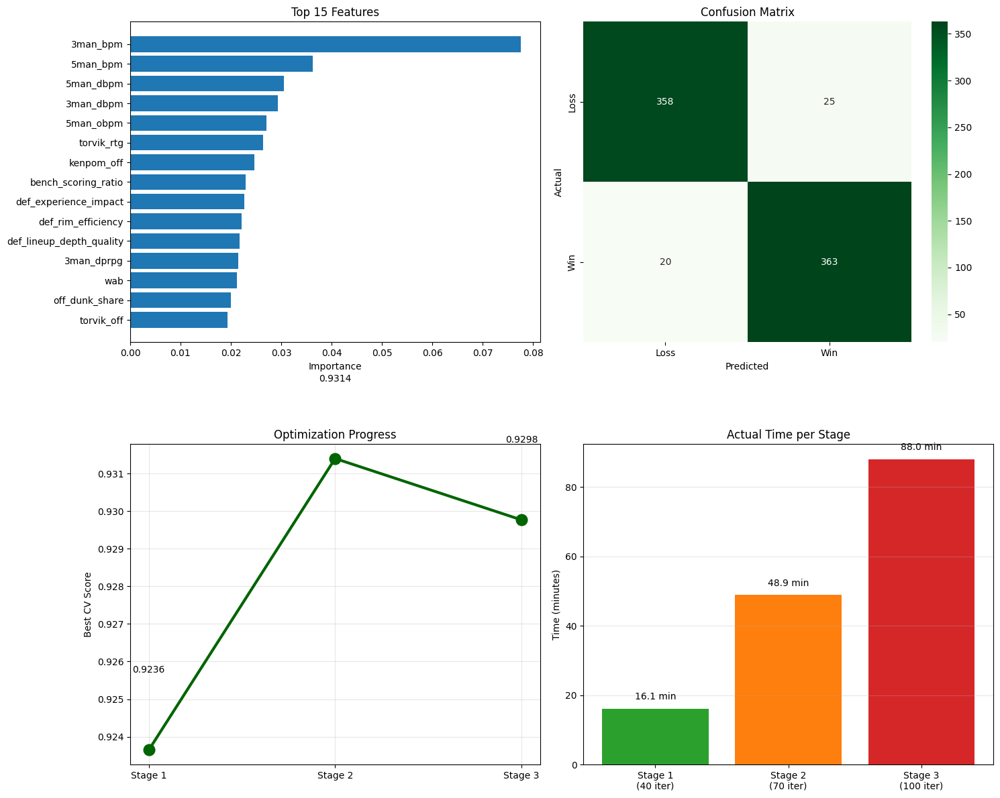


FINAL SUMMARY
Total combinations: 3500
Total fits: 14000
ACTUAL Total Time: 153.1 minutes (2.55 hours)

Stage breakdown:
  Stage 1: 16.1 min (0.27 hrs)
  Stage 2: 48.9 min (0.82 hrs)
  Stage 3: 88.0 min (1.47 hrs)

Test Accuracy: 0.9413 (94.13%)
Train-Test Gap: 0.0587
CV Stability: 0.0109

🎯 SUCCESS: Great model!

3-STAGE XGBoost COMPLETE! 🚀


In [7]:
# =============================================================================
# FINAL EVALUATION
# =============================================================================
print("\n" + "="*80)
print("TRAINING FINAL MODEL WITH EARLY STOPPING")
print("="*80 + "\n")

best_params_final = random_search_stage3.best_params_.copy()

final_model = xgb.XGBClassifier(
    **best_params_final,
    tree_method='hist',
    device='cuda',
    random_state=42,
    eval_metric='logloss',
    enable_categorical=False
)

final_model.fit(
    X_train_scaled, y_train,
    eval_set=[(X_train_scaled, y_train), (X_val_scaled, y_val)],
    verbose=False
)

print(f"Final model trained")

best_xgb = final_model

print("\n" + "="*80)
print("FINAL MODEL EVALUATION")
print("="*80 + "\n")

y_train_pred = best_xgb.predict(X_train_scaled)
y_val_pred = best_xgb.predict(X_val_scaled)
y_test_pred = best_xgb.predict(X_test_scaled)

train_accuracy = accuracy_score(y_train, y_train_pred)
val_accuracy = accuracy_score(y_val, y_val_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Performance Across All Stages:")
print(f"  Stage 1 CV: {random_search_stage1.best_score_:.4f}")
print(f"  Stage 2 CV: {random_search_stage2.best_score_:.4f}")
print(f"  Stage 3 CV: {random_search_stage3.best_score_:.4f}")
print(f"  Total Improvement: {random_search_stage3.best_score_ - random_search_stage1.best_score_:.4f}")

print(f"\nFinal Model Performance:")
print(f"  Training:   {train_accuracy:.4f} ({train_accuracy*100:.2f}%)")
print(f"  Validation: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
print(f"  Test:       {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")

print(f"\nOverfitting Analysis:")
print(f"  Train-Val Gap:  {train_accuracy - val_accuracy:.4f} ({(train_accuracy - val_accuracy)*100:.2f}%)")
print(f"  Train-Test Gap: {train_accuracy - test_accuracy:.4f} ({(train_accuracy - test_accuracy)*100:.2f}%)")

if train_accuracy - test_accuracy > 0.10:
    print("\n⚠️  SEVERE: Significant overfitting (>10%)")
elif train_accuracy - test_accuracy > 0.05:
    print("\n⚠️  WARNING: Moderate overfitting (5-10%)")
else:
    print("\n✓ Good generalization!")

print(f"\n{'='*80}")
print("Classification Report (Test):")
print("="*80)
print(classification_report(y_test, y_test_pred))

cm = confusion_matrix(y_test, y_test_pred)
print(f"\nConfusion Matrix:")
print(f"                 Predicted")
print(f"                Loss    Win")
print(f"Actual Loss     {cm[0,0]:4d}   {cm[0,1]:4d}")
print(f"       Win      {cm[1,0]:4d}   {cm[1,1]:4d}")

cv_scores = cross_val_score(best_xgb, X_train_scaled, y_train, cv=5, scoring='accuracy')
print(f"\n5-Fold CV: {cv_scores}")
print(f"Mean: {cv_scores.mean():.4f} | Std: {cv_scores.std():.4f}")

if cv_scores.std() > 0.05:
    print("⚠️  High variance")
else:
    print("✓ Stable model")

feature_importance = pd.DataFrame({
    'feature': features,
    'importance': best_xgb.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 Features:")
print(feature_importance.head(10).to_string(index=False))

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

top_features = feature_importance.head(15)
axes[0, 0].barh(range(len(top_features)), top_features['importance'])
axes[0, 0].set_yticks(range(len(top_features)))
axes[0, 0].set_yticklabels(top_features['feature'])
axes[0, 0].set_xlabel('Importance')
axes[0, 0].set_title('Top 15 Features')
axes[0, 0].invert_yaxis()

sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', cbar=True,
            xticklabels=['Loss', 'Win'], yticklabels=['Loss', 'Win'], ax=axes[0, 1])
axes[0, 1].set_title('Confusion Matrix')
axes[0, 1].set_ylabel('Actual')
axes[0, 1].set_xlabel('Predicted')

stage_scores = [
    random_search_stage1.best_score_,
    random_search_stage2.best_score_,
    random_search_stage3.best_score_
]
axes[1, 0].plot(['Stage 1', 'Stage 2', 'Stage 3'], stage_scores, marker='o', linewidth=3, markersize=12, color='darkgreen')
axes[1, 0].set_ylabel('Best CV Score')
axes[1, 0].set_title('Optimization Progress')
axes[1, 0].grid(True, alpha=0.3)
for i, score in enumerate(stage_scores):
    axes[1, 0].text(i, score + 0.002, f'{score:.4f}', ha='center', va='bottom')

stage_times = [stage1_time/60, stage2_time/60, stage3_time/60]
axes[1, 1].bar(['Stage 1\n(40 iter)', 'Stage 2\n(70 iter)', 'Stage 3\n(100 iter)'], stage_times, color=['#2ca02c', '#ff7f0e', '#d62728'])
axes[1, 1].set_ylabel('Time (minutes)')
axes[1, 1].set_title('Actual Time per Stage')
axes[1, 1].grid(True, alpha=0.3, axis='y')
for i, t in enumerate(stage_times):
    axes[1, 1].text(i, t + 2, f'{t:.1f} min', ha='center', va='bottom')

plt.tight_layout()
plt.show()

total_time = stage1_time + stage2_time + stage3_time
total_combinations = 500 + 1000 + 2000
total_fits = (500 * 4) + (1000 * 4) + (2000 * 4)

print(f"\n{'='*80}")
print("FINAL SUMMARY")
print("="*80)
print(f"Total combinations: {total_combinations}")
print(f"Total fits: {total_fits}")
print(f"ACTUAL Total Time: {total_time/60:.1f} minutes ({total_time/3600:.2f} hours)")
print(f"\nStage breakdown:")
print(f"  Stage 1: {stage1_time/60:.1f} min ({stage1_time/3600:.2f} hrs)")
print(f"  Stage 2: {stage2_time/60:.1f} min ({stage2_time/3600:.2f} hrs)")
print(f"  Stage 3: {stage3_time/60:.1f} min ({stage3_time/3600:.2f} hrs)")
print(f"\nTest Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"Train-Test Gap: {train_accuracy - test_accuracy:.4f}")
print(f"CV Stability: {cv_scores.std():.4f}")

if test_accuracy > 0.70 and train_accuracy - test_accuracy < 0.08:
    print(f"\n🎯 SUCCESS: Great model!")
elif test_accuracy > 0.65:
    print(f"\n✓ Good model")
else:
    print(f"\n⚠️  Could improve")

print("\n" + "="*80)
print("3-STAGE XGBoost COMPLETE! 🚀")
print("="*80)